# Check processing of Master FlatsDM at CC

**Kernel lsst_distrib_w_2021_44**

In [73]:
!pwd

/pbs/throng/lsst/users/dagoret/desc/AuxTelComm/notebookccdm/anaflats


In [74]:
import os
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
from matplotlib.colors import LogNorm

from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.ticker                         # here's where the formatter is
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from astropy.visualization import (MinMaxInterval, SqrtStretch,ZScaleInterval,PercentileInterval,
                                   ImageNormalize,imshow_norm)
from astropy.visualization.stretch import SinhStretch, LinearStretch,AsinhStretch,LogStretch

from astropy.io import fits

In [75]:
# Bokeh for interactive visualization
import bokeh
from bokeh.io import output_file, output_notebook, show
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource, CDSView, GroupFilter, HoverTool
from bokeh.plotting import figure
from bokeh.transform import factor_cmap

import holoviews as hv
from holoviews import streams, opts
from holoviews.operation.datashader import rasterize
from holoviews.operation.datashader import datashade, dynspread
from holoviews.plotting.util import process_cmap


import datashader as dsh

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
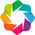

Loading BokehJS ...

In [76]:
# Set the holoviews plotting library to be bokeh
# You will see the holoviews + bokeh icons displayed when the library is loaded successfully
#hv.extension('bokeh')
hv.extension('bokeh', 'matplotlib')

# Display bokeh plots inline in the notebook
output_notebook()

In [77]:
! eups list -s | grep LOCAL

atmospec              LOCAL:/sps/lsst/groups/auxtel/softs/shared/auxteldm/repos/w_2021_44/atmospec 	setup
eups                  LOCAL:/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2021_44/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.7.0-ext/eups 	setup
obs_lsst              LOCAL:/sps/lsst/groups/auxtel/softs/shared/auxteldm/repos/w_2021_44/obs_lsst 	setup
rapid_analysis        LOCAL:/sps/lsst/groups/auxtel/softs/shared/auxteldm/repos/w_2021_44/rapid_analysis 	setup


In [78]:
transform = AsinhStretch() + PercentileInterval(99.)

In [79]:
#! pip install holoview

In [80]:
path_MasterFlats = "/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat"

#BG40~empty  FELH0600~empty  RG610~empty  SDSSg~empty  empty~empty  empty~holo4_003

## List of filters
-  BG40~empty  FELH0600~empty  RG610~empty  SDSSg~empty  empty~empty  empty~holo4_003

In [81]:
list_of_flatfilters=os.listdir(path_MasterFlats)
list_of_flatfilters

['empty~holo4_003',
 'RG610~empty',
 'BG40~empty',
 'empty~empty',
 'SDSSg~empty',
 'FELH0600~empty']

# Select the filter

In [82]:
index=2

In [83]:
path_MasterFlats_Filters =  list_of_flatfilters[index]
path_MasterFlats_Filters

'RG610~empty'

In [84]:
path_flats = os.path.join(path_MasterFlats,path_MasterFlats_Filters)
path_flats 

'/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty'

In [85]:
path_flats_dates = os.listdir(path_flats) 
path_flats_dates

['2021-07-08',
 '2021-02-17',
 '2021-07-07',
 '2021-02-16',
 '2021-03-11',
 '2021-02-18',
 '2021-06-09',
 '2021-06-08']

In [86]:
list_filename_flat     = []
list_fullfilename_flat = []

for thedate in path_flats_dates:
    path_theflat = os.path.join(path_flats,thedate)
    filename_flats = os.listdir(path_theflat)
    print(filename_flats)
    list_filename_flat.append( filename_flats[0])
    list_fullfilename_flat.append( os.path.join(path_theflat ,filename_flats[0]))

['flat_RG610~empty-det000_2021-07-08.fits']
['flat_RG610~empty-det000_2021-02-17.fits']
['flat_RG610~empty-det000_2021-07-07.fits']
['flat_RG610~empty-det000_2021-02-16.fits']
['flat_RG610~empty-det000_2021-03-11.fits']
['flat_RG610~empty-det000_2021-02-18.fits']
['flat_RG610~empty-det000_2021-06-09.fits']
['flat_RG610~empty-det000_2021-06-08.fits']


In [87]:
list_filename_flat

['flat_RG610~empty-det000_2021-07-08.fits',
 'flat_RG610~empty-det000_2021-02-17.fits',
 'flat_RG610~empty-det000_2021-07-07.fits',
 'flat_RG610~empty-det000_2021-02-16.fits',
 'flat_RG610~empty-det000_2021-03-11.fits',
 'flat_RG610~empty-det000_2021-02-18.fits',
 'flat_RG610~empty-det000_2021-06-09.fits',
 'flat_RG610~empty-det000_2021-06-08.fits']

In [88]:
NFlats = len(list_filename_flat)

In [89]:
list_fullfilename_flat

['/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-07-08/flat_RG610~empty-det000_2021-07-08.fits',
 '/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-02-17/flat_RG610~empty-det000_2021-02-17.fits',
 '/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-07-07/flat_RG610~empty-det000_2021-07-07.fits',
 '/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-02-16/flat_RG610~empty-det000_2021-02-16.fits',
 '/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-03-11/flat_RG610~empty-det000_2021-03-11.fits',
 '/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-02-18/flat_RG610~empty-det000_2021-02-18.fits',
 '/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-06-09/flat_RG610~empty-det000_2021-06-09

In [90]:
# choose the flat index
findex=0

In [91]:
full_filename_flat = list_fullfilename_flat[findex]
filename_flat = list_filename_flat[findex]
hdul_flat= fits.open(full_filename_flat)

In [92]:
hdul_flat.info()

Filename: /sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-07-08/flat_RG610~empty-det000_2021-07-08.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  Segment10     1 PrimaryHDU     121   ()      
  1  IMAGE         1 CompImageHDU     22   (4072, 4000)   float32   
  2  MASK          1 CompImageHDU     30   (4072, 4000)   int32   
  3  VARIANCE      1 CompImageHDU     22   (4072, 4000)   float32   
  4  ARCHIVE_INDEX    1 BinTableHDU     41   0R x 7C   [1J, 1J, 1J, 1J, 1J, 64A, 64A]   


In [93]:
image=hdul_flat[1].data
#image=hdul_calexp[1].data

In [94]:
scaledImage=transform(image)

In [95]:
plt.imshow(scaledImage,origin="lower")

In [96]:
rotscaledImage=np.rot90(scaledImage)

In [97]:
#from holoviews import streams
from holoviews.streams import Stream, param
listing = ', '.join(sorted([str(s.name) for s in param.descendents(streams.LinkedStream)]))
print('The linked stream classes supported by HoloViews are:\n\n{listing}'.format(listing=listing))

The linked stream classes supported by HoloViews are:

BoundsX, BoundsXY, BoundsY, BoxEdit, CDSStream, CurveEdit, DoubleTap, Draw, FreehandDraw, Lasso, LinkedStream, MouseEnter, MouseLeave, PanEnd, PlotReset, PlotSize, PointDraw, PointerX, PointerXY, PointerY, PolyDraw, PolyEdit, PressUp, RangeX, RangeXY, RangeY, SelectMode, Selection1D, SelectionXY, SingleTap, Tap


In [98]:
TOOLTIPS = [
    ('name', "$name"),
    ('index', "$index"),
    ('pattern', '@pattern'),
    ("x", "$x"),
    ("y", "$y"),
    ("value", "@image"),
    ('squared', '@squared')
]

TOOLTIPS = [
    ("(x,y)", "($x, $y)"),
]

hover = HoverTool(description='Custom Tooltip', tooltips=[('x', '@x'), ('y', '@y')])


# Custom hover tool for the source detections
myhover = HoverTool(
    tooltips=[
        ( 'x', '@x{0.2f}'),
        ( 'y', '@y{0.2f}'),
    ],
    formatters={
        'x' : 'printf',
        'y' : 'printf',
    },
    
)

In [99]:
# Define some default plot options for the Image
img_opts = dict(
                #height=600, width=700, 
                xaxis="bottom", 
                padding = 0.01, fontsize={'title': '8pt'},
                colorbar=True, toolbar='right', show_grid=True,
                aspect='equal',
                frame_width=400,
                tools=['hover','crosshair','undo','redo','zoom_in','zoom_out'],
                #tools=[myhover,'crosshair'],
               )     

In [100]:
# Create the Image element.
bounds_img=(0,0,rotscaledImage.shape[1],rotscaledImage.shape[0])
img = hv.Image(rotscaledImage, bounds=bounds_img,
               kdims=['x', 'y']).opts(
    cmap = "Greys_r",  xlabel = 'x', ylabel ='y',
    title = filename_flat,
    **img_opts)

In [101]:
rasterize(img)

:DynamicMap   []
   :Image   [x,y]   (z)

# All Flats

In [102]:


for findex in range(NFlats):
    full_filename_flat = list_fullfilename_flat[findex]
    filename_flat = list_filename_flat[findex]
    hdul_flat= fits.open(full_filename_flat)
    
    print(hdul_flat.info())
    
    image=hdul_flat[1].data
    
    
    scaledImage=transform(image)
    
    
    rotscaledImage=np.rot90(scaledImage)
    
    
    
    # Create the Image element.
    bounds_img=(0,0,rotscaledImage.shape[1],rotscaledImage.shape[0])
    img = hv.Image(rotscaledImage, bounds=bounds_img,
               kdims=['x', 'y']).opts(
    cmap = "Greys_r",  xlabel = 'x', ylabel ='y',
    title = filename_flat,
    **img_opts)
    
    if findex ==0:
        layout = rasterize(img)
    else:
        layout = layout + rasterize(img) 

Filename: /sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-07-08/flat_RG610~empty-det000_2021-07-08.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  Segment10     1 PrimaryHDU     121   ()      
  1  IMAGE         1 CompImageHDU     22   (4072, 4000)   float32   
  2  MASK          1 CompImageHDU     30   (4072, 4000)   int32   
  3  VARIANCE      1 CompImageHDU     22   (4072, 4000)   float32   
  4  ARCHIVE_INDEX    1 BinTableHDU     41   0R x 7C   [1J, 1J, 1J, 1J, 1J, 64A, 64A]   
None
Filename: /sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret_jan22_flats/flat/RG610~empty/2021-02-17/flat_RG610~empty-det000_2021-02-17.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  Segment10     1 PrimaryHDU     125   ()      
  1  IMAGE         1 CompImageHDU     22   (4072, 4000)   float32   
  2  MASK          1 CompImageHDU     30   (4072, 4000)   int32   
  3  VARIANCE      1 CompImageHDU     2

In [103]:
layout.cols(2)

:Layout
   .DynamicMap.I    :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.II   :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.III  :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.IV   :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.V    :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.VI   :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.VII  :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.VIII :DynamicMap   []
      :Image   [x,y]   (z)

# Referenced Flat

In [104]:
filename_flat="flat_SDSSg~empty-det000_2021-11-04.fits"

In [105]:
fullfilename_flat="/sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret/flat/SDSSg~empty/2021-11-04/flat_SDSSg~empty-det000_2021-11-04.fits"

In [106]:
hdul_flat = fits.open(fullfilename_flat)

In [107]:
hdul_flat.info()

Filename: /sps/lsst/groups/auxtel/softs/shared/auxteldm/rerun/dagoret/flat/SDSSg~empty/2021-11-04/flat_SDSSg~empty-det000_2021-11-04.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  Segment10     1 PrimaryHDU     125   ()      
  1  IMAGE         1 CompImageHDU     22   (4072, 4000)   float32   
  2  MASK          1 CompImageHDU     30   (4072, 4000)   int32   
  3  VARIANCE      1 CompImageHDU     22   (4072, 4000)   float32   
  4  ARCHIVE_INDEX    1 BinTableHDU     41   0R x 7C   [1J, 1J, 1J, 1J, 1J, 64A, 64A]   


In [108]:
img_flat=hdul_flat[1].data

In [109]:
# Create the Image element.
bounds_img=(0,0,img_flat.shape[1],img_flat.shape[0])
hvimg_flat = hv.Image(img_flat, bounds=bounds_img,
               kdims=['x', 'y']).opts(
    cmap = "Greys_r",  xlabel = 'x', ylabel ='y',
    title = filename_flat,
    **img_opts)

In [110]:
rasterize(hvimg_flat)

:DynamicMap   []
   :Image   [x,y]   (z)

In [111]:
plt.hist(hdul_flat[1].data)

(array([[   0.,    8., 3992., ...,    0.,    0.,    0.],
        [   0.,    6., 3994., ...,    0.,    0.,    0.],
        [   0.,    6., 3994., ...,    0.,    0.,    0.],
        ...,
        [   0.,  727., 3273., ...,    0.,    0.,    0.],
        [   0.,  800., 3200., ...,    0.,    0.,    0.],
        [   0.,  887., 3113., ...,    0.,    0.,    0.]]),
 array([6.7345588e-04, 3.1607062e-01, 6.3146776e-01, 9.4686490e-01,
        1.2622621e+00, 1.5776592e+00, 1.8930564e+00, 2.2084534e+00,
        2.5238507e+00, 2.8392477e+00, 3.1546450e+00], dtype=float32),
 <a list of 4072 BarContainer objects>)